In [1]:
pip install SimpleITK

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 5.9 MB/s eta 0:00:00


In [2]:
 pip install scikit-optimize

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.7/107.7 kB 1.2 MB/s eta 0:00:00


In [ ]:
pip install scikit-fuzzy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.0/994.0 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.4.2-py3-none-any.whl size=894078 sha256=c9923000b620d86f85850ab965d38db07f1b358b15da290c930cbc8ac9395590
  Stored in directory: /root/.cache/pip/wheels/4f/86/1b/dfd97134a2c8313e519bcebd95d3fedc7be7944db022094bc8
Successfully built scikit-fuzzy


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage import morphology
from skimage.filters import threshold_otsu
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import confusion_matrix
import SimpleITK as sitk
from scipy.io import loadmat

In [2]:
from scipy.io import loadmat

In [3]:
data = loadmat('./Brain.mat')
T1_data=data['T1']
# Extract the ground truth labels (assuming they're stored in a variable named 'label')
ground_truth_labels = data['label']
# Display the dimensions of the MRI data
num_slices, height, width = 10 , 362 , 434
print(f"Number of slices: {num_slices}")
print(f"Image dimensions: {height}x{width}")

Number of slices: 10
Image dimensions: 362x434


In [4]:
def normalize_intensity(slice_data):
    min_intensity = np.min(slice_data)
    max_intensity = np.max(slice_data)
    normalized_data = (slice_data - min_intensity) / (max_intensity - min_intensity)
    return normalized_data

def gaussian_smoothing(slice_data, sigma=1.0):
    smoothed_data = cv2.GaussianBlur(slice_data, (0, 0), sigmaX=sigma, sigmaY=sigma)
    return smoothed_data

def bias_field_correction(slice_data):
    image = sitk.GetImageFromArray(slice_data)
    corrector = sitk.N4BiasFieldCorrectionImageFilter()
    corrected_image = corrector.Execute(image)
    corrected_data = sitk.GetArrayFromImage(corrected_image)
    return corrected_data
def calculate_iou(segmented_slice, ground_truth_slice):
    segmented_slice_bool = segmented_slice.astype(bool)
    TP = np.logical_and(segmented_slice_bool, ground_truth_slice).sum()
    FP = np.logical_and(segmented_slice_bool, ~ground_truth_slice).sum()
    FN = np.logical_and(~segmented_slice_bool, ground_truth_slice).sum()
    IoU = TP / (TP + FP + FN)
    return IoU

def perform_kmeans_clustering(segmented_image, num_clusters):
    # Reshape the skull-removed slice for K-means clustering
    reshaped_data = segmented_image.reshape((-1, 1))

    # Perform K-means clustering for the current slice
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    kmeans.fit(reshaped_data)

    # Get cluster labels and reshape them back to the original shape
    cluster_labels = kmeans.labels_
    cluster_labels = cluster_labels.reshape(segmented_image.shape)

    return cluster_labels

def match_labels(segmented_image, ground_truth_image):
    iou_dict = {}
    unique_labels_seg = np.unique(segmented_image)
    unique_labels_gt = np.unique(ground_truth_image)
    for label_seg in unique_labels_seg:
        if label_seg == 0:
            continue
        iou_values = []
        roi_seg = (segmented_image == label_seg)
        for label_gt in unique_labels_gt:
            roi_gt = (ground_truth_image == label_gt)
            intersection = np.logical_and(roi_seg, roi_gt).sum()
            union = np.logical_or(roi_seg, roi_gt).sum()
            iou = intersection / union
            iou_values.append(iou)
        matched_label_gt = unique_labels_gt[np.argmax(iou_values)]
        iou_dict[label_seg] = matched_label_gt
    matched_labels = np.vectorize(iou_dict.get)(segmented_image)
    return matched_labels

**SIMPLE K MEANS**

iou score for slice 1 :  0.4184
iou score for slice 2 :  0.3941
iou score for slice 3 :  0.4835
iou score for slice 4 :  0.3381
iou score for slice 5 :  0.3804
iou score for slice 6 :  0.4835
iou score for slice 7 :  0.3918
iou score for slice 8 :  0.3903
iou score for slice 9 :  0.3899
iou score for slice 10 :  0.3907
Average iou coefficient: 0.4061


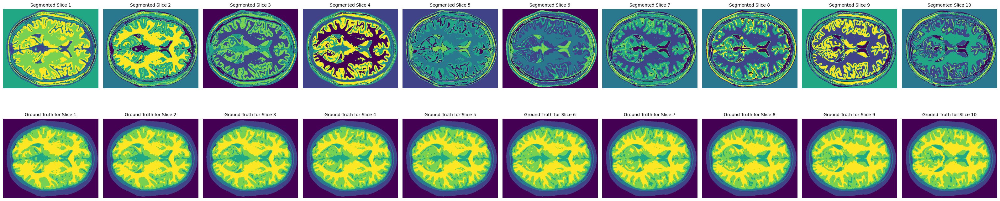

In [7]:
# Specify the number of clusters (tissue types)
num_clusters = 6

# Calculate the number of subplot rows and columns
num_slices = T1_data.shape[2]
num_cols = num_slices

# Create subplots
fig, axs = plt.subplots(2, num_cols, figsize=(32,8))

# Lists to store Dice coefficients for each slice
iou_scores = []

# Iterate through each slice
for i in range(num_slices):
    # Extract the current slice
    slice_data = T1_data[:, :, i]
    segmented_slice = perform_kmeans_clustering(slice_data,6)
    ground_truth_slice = ground_truth_labels[:, :, i]
    iou = calculate_iou(segmented_slice,ground_truth_slice)
    print(f"iou score for slice {i+1} : {iou: .4f}")
    iou_scores.append(iou)

    # Visualize the segmented image for the current slice
    ax = axs[0, i % num_cols]
    ax.imshow(segmented_slice, cmap='viridis')
    ax.set_title(f'Segmented Slice {i+1}',fontsize=num_cols)
    ax.axis('off')


    # Visualize the ground truth label for the current slice
    ax = axs[1, i % num_cols]
    ax.imshow(ground_truth_slice, cmap='viridis')
    ax.set_title(f'Ground Truth for Slice {i+1}',fontsize=num_cols)
    ax.axis('off')


# Calculate and print the average Dice coefficient across all slices
average_iou_score = np.mean(iou_scores)
print(f"Average iou coefficient: {average_iou_score:.4f}")

plt.tight_layout()
plt.show()


SO WE CAN SEE BAD SEGMENTATION THROUGH VIUSAL COMPARISON WITH THE GROUND TRUTH AND IOU SCORE ALSO NOT GOOD GOING DOWN EVEN 0.33 FOR SOME SLICES

**Now we will try some preprocessing techniques first we will normalize the intensity and use gaussian smoothing for noise reduction**

iou score for slice 1 :  0.4184
iou score for slice 2 :  0.3941
iou score for slice 3 :  0.4835
iou score for slice 4 :  0.3381
iou score for slice 5 :  0.3804
iou score for slice 6 :  0.4835
iou score for slice 7 :  0.3918
iou score for slice 8 :  0.3348
iou score for slice 9 :  0.3899
iou score for slice 10 :  0.3907
Average iou coefficient: 0.4005


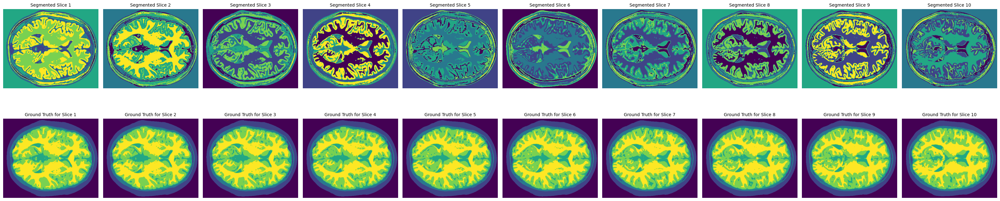

In [8]:
# Specify the number of clusters (tissue types)
num_clusters = 6

# Calculate the number of subplot rows and columns
num_slices = T1_data.shape[2]
num_cols = num_slices

# Create subplots
fig, axs = plt.subplots(2, num_cols, figsize=(32,8))

# Lists to store Dice coefficients for each slice
iou_scores = []

# Iterate through each slice
for i in range(num_slices):
    # Extract the current slice
    slice_data = T1_data[:, :, i]
    normalized_slice = normalize_intensity(slice_data)
    smoothed_slice = gaussian_smoothing(normalized_slice,sigma=0.01)
    segmented_slice = perform_kmeans_clustering(smoothed_slice,6)
    ground_truth_slice = ground_truth_labels[:, :, i]
    iou = calculate_iou(segmented_slice,ground_truth_slice)
    print(f"iou score for slice {i+1} : {iou: .4f}")
    iou_scores.append(iou)

    # Visualize the segmented image for the current slice
    ax = axs[0, i % num_cols]
    ax.imshow(segmented_slice, cmap='viridis')
    ax.set_title(f'Segmented Slice {i+1}',fontsize=num_cols)
    ax.axis('off')


    # Visualize the ground truth label for the current slice
    ax = axs[1, i % num_cols]
    ax.imshow(ground_truth_slice, cmap='viridis')
    ax.set_title(f'Ground Truth for Slice {i+1}',fontsize=num_cols)
    ax.axis('off')


# Calculate and print the average Dice coefficient across all slices
average_iou_score = np.mean(iou_scores)
print(f"Average iou coefficient: {average_iou_score:.4f}")

plt.tight_layout()
plt.show()


**now we will apply the bias correction**

iou score for slice 1 :  0.4826
iou score for slice 2 :  0.4828
iou score for slice 3 :  0.4827
iou score for slice 4 :  0.3612
iou score for slice 5 :  0.3913
iou score for slice 6 :  0.3956
iou score for slice 7 :  0.3343
iou score for slice 8 :  0.3277
iou score for slice 9 :  0.3937
iou score for slice 10 :  0.3922
Average iou coefficient: 0.4044


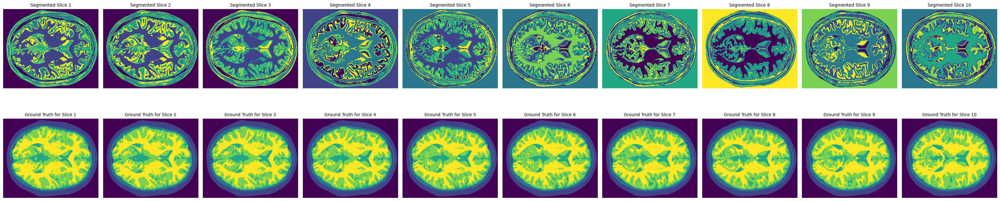

In [9]:

# Specify the number of clusters (tissue types)
num_clusters = 6

# Calculate the number of subplot rows and columns
num_slices = T1_data.shape[2]
num_cols = num_slices

# Create subplots
fig, axs = plt.subplots(2, num_cols, figsize=(32,8))

# Lists to store Dice coefficients for each slice
iou_scores = []

# Iterate through each slice
for i in range(num_slices):
    # Extract the current slice
    slice_data = T1_data[:, :, i]
    corrected_slice = bias_field_correction(slice_data)
    segmented_slice = perform_kmeans_clustering(corrected_slice,6)
    ground_truth_slice = ground_truth_labels[:, :, i]
    iou = calculate_iou(segmented_slice,ground_truth_slice)
    print(f"iou score for slice {i+1} : {iou: .4f}")
    iou_scores.append(iou)

    # Visualize the segmented image for the current slice
    ax = axs[0, i % num_cols]
    ax.imshow(segmented_slice, cmap='viridis')
    ax.set_title(f'Segmented Slice {i+1}',fontsize=num_cols)
    ax.axis('off')


    # Visualize the ground truth label for the current slice
    ax = axs[1, i % num_cols]
    ax.imshow(ground_truth_slice, cmap='viridis')
    ax.set_title(f'Ground Truth for Slice {i+1}',fontsize=num_cols)
    ax.axis('off')


# Calculate and print the average Dice coefficient across all slices
average_iou_score = np.mean(iou_scores)
print(f"Average iou coefficient: {average_iou_score:.4f}")

plt.tight_layout()
plt.show()


applying bias correction is improving the iou score somewhat.

Iou score for slice 1: 0.4380
Iou score for slice 2: 0.4365
Iou score for slice 3: 0.4354
Iou score for slice 4: 0.4354
Iou score for slice 5: 0.4357
Iou score for slice 6: 0.4358
Iou score for slice 7: 0.4338
Iou score for slice 8: 0.4331
Iou score for slice 9: 0.4342
Iou score for slice 10: 0.4337
Average iou coefficient: 0.4352


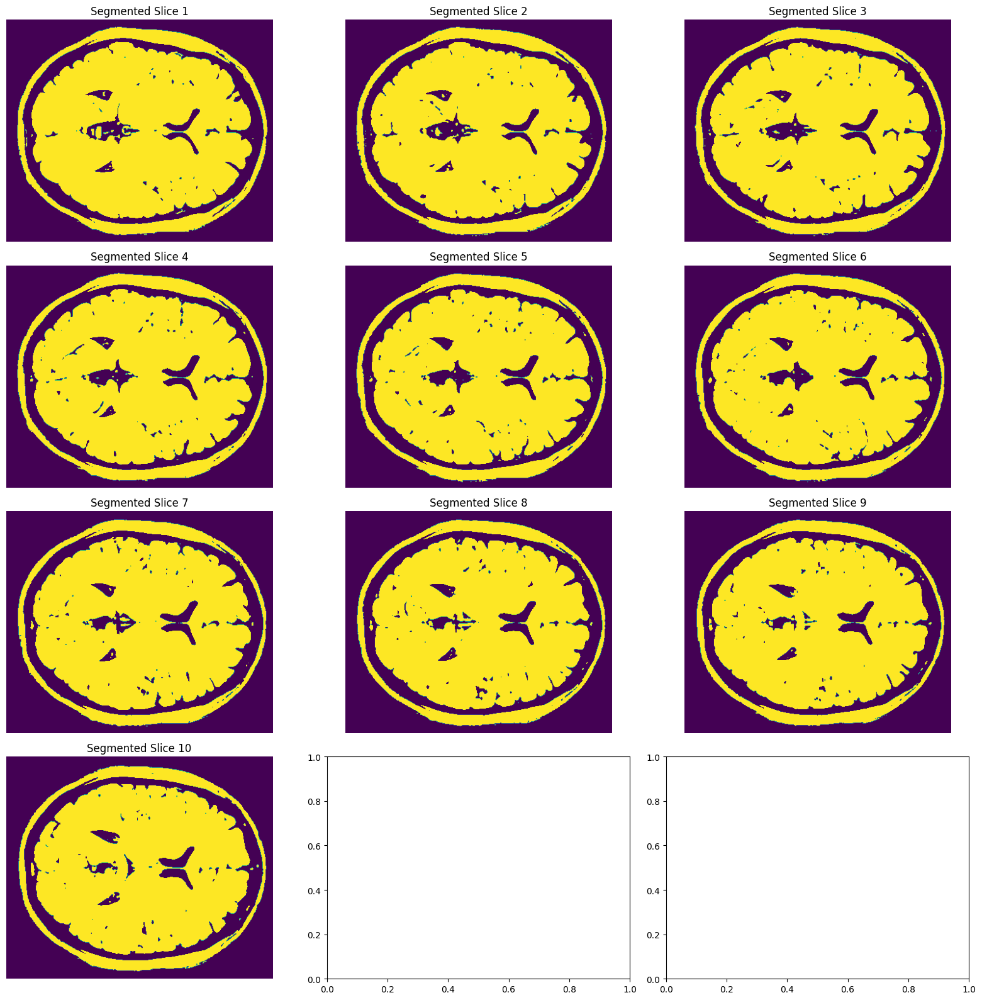

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function for multi-level Otsu thresholding
def multi_level_otsu(slice_data, num_clusters):
    # Convert to 8-bit unsigned integer
    slice_data_uint8 = (slice_data * 255).astype(np.uint8)

    # Initialize segmented slice
    segmented_slice = np.zeros_like(slice_data)

    # Calculate thresholds using Otsu's method
    thresholds = []
    for i in range(1, num_clusters):
        _, thresholded_slice = cv2.threshold(slice_data_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        thresholds.append(thresholded_slice)

        # Update the segmented slice
        segmented_slice[thresholded_slice > 0] = i

        # Mask out pixels already segmented
        slice_data[thresholded_slice > 0] = 0

    return segmented_slice

# Specify the number of clusters (tissue types)
num_clusters = 5

# Calculate the number of subplot rows and columns
num_slices = T1_data.shape[2]
num_cols = min(num_slices, 3)
num_rows = (num_slices + 2) // num_cols

# Lists to store Dice coefficients for each slice
iou_scores = []

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(16, num_rows * 4))

# Iterate through each slice
for i in range(num_slices):
    # Extract the current slice
    slice_data = T1_data[:, :, i]
    ground_truth_slice = ground_truth_labels[:, :, i]

    # Apply bias field correction
    corrected_slice = bias_field_correction(slice_data)

    # Normalize intensity
    normalized_slice = normalize_intensity(corrected_slice)

    # Perform multi-level Otsu thresholding
    segmented_slice = multi_level_otsu(normalized_slice, num_clusters)

    # Calculate iou coefficient
    iou = calculate_iou(segmented_slice, ground_truth_slice)
    iou_scores.append(iou)
    print(f'Iou score for slice {i+1}: {iou:.4f}')

    # Visualize the segmented image for the current slice
    ax = axs[i // num_cols, i % num_cols]
    ax.imshow(segmented_slice, cmap='viridis')
    ax.set_title(f'Segmented Slice {i+1}')
    ax.axis('off')

# Calculate and print the average Dice coefficient across all slices
average_iou_score = np.mean(iou_scores)
print(f"Average iou coefficient: {average_iou_score:.4f}")

plt.tight_layout()
plt.show()



ottsu is not looking good by visualy, now we will try using canny edge detector as preprocession


Iou score for slice 1: 0.4236
Iou score for slice 2: 0.4232
Iou score for slice 3: 0.4227
Iou score for slice 4: 0.4223
Iou score for slice 5: 0.4218
Iou score for slice 6: 0.4213
Iou score for slice 7: 0.4207
Iou score for slice 8: 0.4200
Iou score for slice 9: 0.4193
Iou score for slice 10: 0.4186
Average iou coefficient: 0.4214


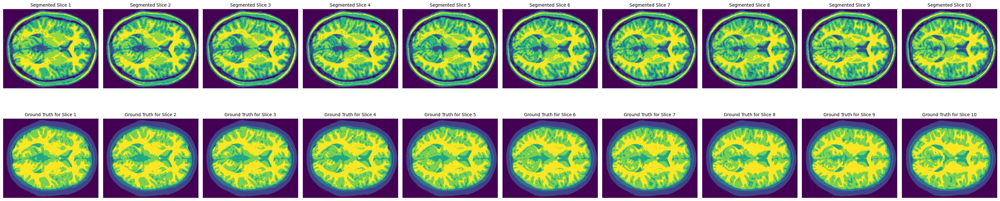

In [13]:
def edge_based_segmentation(slice_data, num_clusters):
    # Correct bias field
    #corrected_slice = bias_field_correction(slice_data)

    # Smooth the slice
    smoothed_slice = gaussian_smoothing(slice_data)

    # Normalize intensity
    normalized_slice = normalize_intensity(smoothed_slice)

    # Apply Canny edge detection
    edges = cv2.Canny((corrected_slice * 255).astype(np.uint8), 100, 200)

    # Enhance the edges
    enhanced_edges = cv2.GaussianBlur(edges, (0, 0), sigmaX=2)

    # Overlay enhanced edges on the original image
    overlaid_image = cv2.addWeighted((normalized_slice * 255).astype(np.uint8), 0.8, enhanced_edges, 0.2, 0)

    # Apply K-means clustering on the overlaid image
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=6)
    kmeans.fit(overlaid_image.reshape(-1, 1))
    cluster_centers = kmeans.cluster_centers_
    segmented_slice = cluster_centers[kmeans.labels_].reshape(slice_data.shape)

    return segmented_slice

# Specify the number of clusters (tissue types)
num_clusters = 6

# Calculate the number of subplot rows and columns
num_slices = T1_data.shape[2]
num_cols = num_slices
num_rows = (num_slices + 2) // num_cols

# Create subplots
fig, axs = plt.subplots(2, num_cols, figsize=(32,8))

iou_scores=[]

# Iterate through each slice
for i in range(num_slices):
    # Extract the current slice
    slice_data = T1_data[:, :, i]
    ground_truth_slice = ground_truth_labels[:, :, i]

    # Perform edge-based segmentation
    segmented_slice = edge_based_segmentation(slice_data, num_clusters)
    ground_truth_slice = ground_truth_labels[:, :, i]
    # Calculate iou coefficient
    iou = calculate_iou(segmented_slice, ground_truth_slice)
    iou_scores.append(iou)
    print(f'Iou score for slice {i+1}: {iou:.4f}')


    # Visualize the segmented image for the current slice
    ax = axs[0, i % num_cols]
    ax.imshow(segmented_slice, cmap='viridis')
    ax.set_title(f'Segmented Slice {i+1}',fontsize=num_cols)
    ax.axis('off')


    # Visualize the ground truth label for the current slice
    ax = axs[1, i % num_cols]
    ax.imshow(ground_truth_slice, cmap='viridis')
    ax.set_title(f'Ground Truth for Slice {i+1}',fontsize=num_cols)
    ax.axis('off')

# Calculate and print the average Dice coefficient across all slices
average_iou_score = np.mean(iou_scores)
print(f"Average iou coefficient: {average_iou_score:.4f}")

plt.tight_layout()
plt.show()

Iou score for slice 1: 0.2290
Iou score for slice 2: 0.3895
Iou score for slice 3: 0.2316
Iou score for slice 4: 0.2329
Iou score for slice 5: 0.2344
Iou score for slice 6: 0.3974
Iou score for slice 7: 0.2335
Iou score for slice 8: 0.2340
Iou score for slice 9: 0.3938
Iou score for slice 10: 0.2335
Average iou coefficient: 0.2810


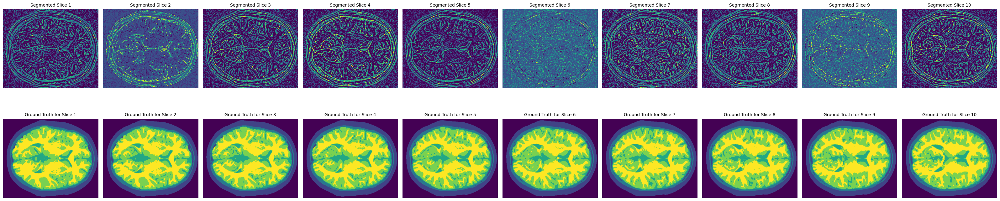

In [18]:
# Function for LoG edge-based segmentation
def log_edge_based_segmentation(slice_data, num_clusters):
    # Bias field correction
    #corrected_slice = bias_field_correction(slice_data)

    # Normalize intensity
    normalized_slice = normalize_intensity(slice_data)

    # Apply Gaussian blur
    blurred_slice = cv2.GaussianBlur(normalized_slice, (3, 3), 0)

    # Convert to 8-bit unsigned integer
    blurred_slice_uint8 = (blurred_slice * 255).astype(np.uint8)

    # Apply Laplacian of Gaussian (LoG)
    log_slice = cv2.Laplacian(blurred_slice_uint8, cv2.CV_8U)

    # Overlay enhanced edges on the original image
    overlaid_image = cv2.addWeighted((normalized_slice * 255).astype(np.uint8), 0.7, log_slice, 0.3, 0)

    # Apply K-means clustering
    log_slice_reshaped = log_slice.reshape(-1, 1).astype(np.float32)  # Reshape to 1D array
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    kmeans.fit(log_slice_reshaped)
    labels = kmeans.labels_

    # Reshape back to original shape
    segmented_slice = labels.reshape(log_slice.shape)

    return segmented_slice

# Specify the number of clusters (tissue types)
num_clusters = 5

# Calculate the number of subplot rows and columns
num_slices = T1_data.shape[2]
num_cols = num_slices
num_rows = (num_slices + 2) // num_cols

# Create subplots
fig, axs = plt.subplots(2, num_cols, figsize=(32,8))

iou_scores=[]

# Iterate through each slice
for i in range(num_slices):
    # Extract the current slice
    slice_data = T1_data[:, :, i]
    ground_truth_slice = ground_truth_labels[:, :, i]

    # Perform LoG edge-based segmentation
    segmented_slice = log_edge_based_segmentation(slice_data, num_clusters)

    # Calculate iou coefficient
    iou = calculate_iou(segmented_slice, ground_truth_slice)
    iou_scores.append(iou)
    print(f'Iou score for slice {i+1}: {iou:.4f}')

    # Visualize the segmented image for the current slice
    ax = axs[0, i % num_cols]
    ax.imshow(segmented_slice, cmap='viridis')
    ax.set_title(f'Segmented Slice {i+1}',fontsize=num_cols)
    ax.axis('off')


    # Visualize the ground truth label for the current slice
    ax = axs[1, i % num_cols]
    ax.imshow(ground_truth_slice, cmap='viridis')
    ax.set_title(f'Ground Truth for Slice {i+1}',fontsize=num_cols)
    ax.axis('off')

# Calculate and print the average Dice coefficient across all slices
average_iou_score = np.mean(iou_scores)
print(f"Average iou coefficient: {average_iou_score:.4f}")

plt.tight_layout()
plt.show()


In [5]:
def apply_kmeans_to_roi(image, num_clusters):
    reshaped_image = image.reshape(-1, 1)
    num_unique_labels = len(np.unique(ground_truth_labels[:, :, i]))
    num_clusters = min(num_unique_labels, num_clusters)
    kmeans = KMeans(n_clusters=num_clusters, random_state=42,n_init=6)
    kmeans.fit(reshaped_image)
    cluster_centers = kmeans.cluster_centers_
    segmented_image = cluster_centers[kmeans.labels_].reshape(image.shape)
    return segmented_image

In [6]:
def match_labels(segmented_image, ground_truth_image):
    iou_dict = {}
    unique_labels_seg = np.unique(segmented_image)
    unique_labels_gt = np.unique(ground_truth_image)
    for label_seg in unique_labels_seg:
        if label_seg == 0:
            continue
        iou_values = []
        roi_seg = (segmented_image == label_seg)
        for label_gt in unique_labels_gt:
            roi_gt = (ground_truth_image == label_gt)
            intersection = np.logical_and(roi_seg, roi_gt).sum()
            union = np.logical_or(roi_seg, roi_gt).sum()
            iou = intersection / union
            iou_values.append(iou)
        matched_label_gt = unique_labels_gt[np.argmax(iou_values)]
        iou_dict[label_seg] = matched_label_gt
    matched_labels = np.vectorize(iou_dict.get)(segmented_image)
    return matched_labels

IoU for slice 1: 0.4236
IoU for slice 2: 0.4232
IoU for slice 3: 0.4227
IoU for slice 4: 0.4223
IoU for slice 5: 0.4218
IoU for slice 6: 0.4213
IoU for slice 7: 0.4207
IoU for slice 8: 0.4200
IoU for slice 9: 0.4193
IoU for slice 10: 0.4186
Average IoU coefficient: 0.4214


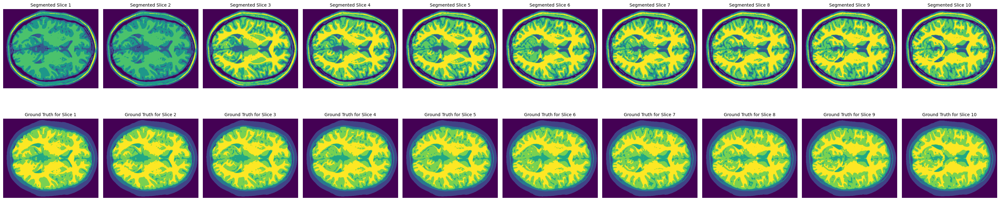

In [17]:
# Specify the number of clusters (tissue types)
num_clusters = 5

# Calculate the number of subplot rows and columns
num_slices = T1_data.shape[2]
num_rows = (num_slices + 2) // 3
num_cols = num_slices

# Create subplots for displaying segmented slices and ground truth labels
fig, axs = plt.subplots(2, num_cols, figsize=(32, 8))

# Initialize a list to store IoU scores for each slice
iou_scores = []

# Iterate through each slice
for i in range(num_slices):
    # Extract the current slice
    slice_data = T1_data[:, :, i]

    # Perform bias field correction and intensity normalization
    corrected_slice = bias_field_correction(slice_data)
    normalized_slice = normalize_intensity(corrected_slice)

    # Convert normalized slice to 8-bit unsigned integer
    normalized_slice_uint8 = (normalized_slice * 255).astype(np.uint8)

    # Apply Otsu's thresholding to obtain a binary image
    _, thresh = cv2.threshold(normalized_slice_uint8, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    thresh_uint8 = thresh.astype(np.uint8)

    # Find contours in the binary image
    contours, _ = cv2.findContours(thresh_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Check if contours are found
    if contours:
        # Create a mask using the largest contour
        mask = np.zeros_like(thresh_uint8)
        cv2.drawContours(mask, [max(contours, key=cv2.contourArea)], -1, (255), thickness=cv2.FILLED)

        # Apply the mask to extract the region of interest (ROI)
        masked_image = cv2.bitwise_and(slice_data, slice_data, mask=mask)

        # Get the bounding rectangle coordinates of the ROI
        x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))

        # Extract the ROI
        roi = masked_image[y:y+h, x:x+w]
    else:
        print("No contours found.")

    # Apply K-means clustering to the ROI
    segmented_roi = apply_kmeans_to_roi(roi, num_clusters)

    # Replace the ROI with the segmented ROI in the original slice
    segmented_slice = normalized_slice.copy()
    segmented_slice[y:y+h, x:x+w] = segmented_roi

    # Match the labels in the segmented image with the ground truth labels
    matched_labels = match_labels(segmented_slice, ground_truth_labels[:, :, i])

    # Extract the ground truth label for the current slice
    ground_truth_slice = ground_truth_labels[:, :, i]

    # Calculate IoU for the current slice
    iou = calculate_iou(segmented_slice, ground_truth_slice)
    iou_scores.append(iou)
    print(f"IoU for slice {i+1}: {iou:.4f}")

    # Visualize the segmented image for the current slice
    ax = axs[0, i % num_cols]
    ax.imshow(segmented_slice, cmap='viridis')
    ax.set_title(f'Segmented Slice {i + 1}', fontsize=num_cols)
    ax.axis('off')

    # Visualize the ground truth label for the current slice
    ax = axs[1, i % num_cols]
    ax.imshow(ground_truth_slice, cmap='viridis')
    ax.set_title(f'Ground Truth for Slice {i + 1}', fontsize=num_cols)
    ax.axis('off')

# Calculate and print the average IoU coefficient across all slices
average_iou_score = np.mean(iou_scores)
print(f"Average IoU coefficient: {average_iou_score:.4f}")

# Adjust layout and display the subplots
plt.tight_layout()
plt.show()


In [ ]:
pip install mayavi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 35.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.3/229.3 kB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.9/268.9 kB 29.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 68.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 48.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 64.3 MB/s eta 0:00:00
  Using cached vtk-9.3.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (92.0 MB)
  Created wheel for mayavi: filename=mayavi-4.8.1-cp310-cp310-linux_x86_64.whl size=16167222 sha256=9ca1375a58e21f22554c3bf31372a941ccc9a689161975ae4fae474aa19e828e
  Stored in directory: /root/.cache/pip/wheels/c2/6b/23/49aa8ae5063a76fbc35ce90e74f8361cddb9d3a86d5a41ec0a
Successfully bu

In [ ]:
pip install PyQt5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 338.1/338.1 kB 34.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 MB 7.6 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:338: FutureWarning: `multichannel` is a deprecated argument name for `slic`. It will be removed in version 1.0. Please use `channel_axis` instead.
  warnings.warn(self.warning_msg.format(


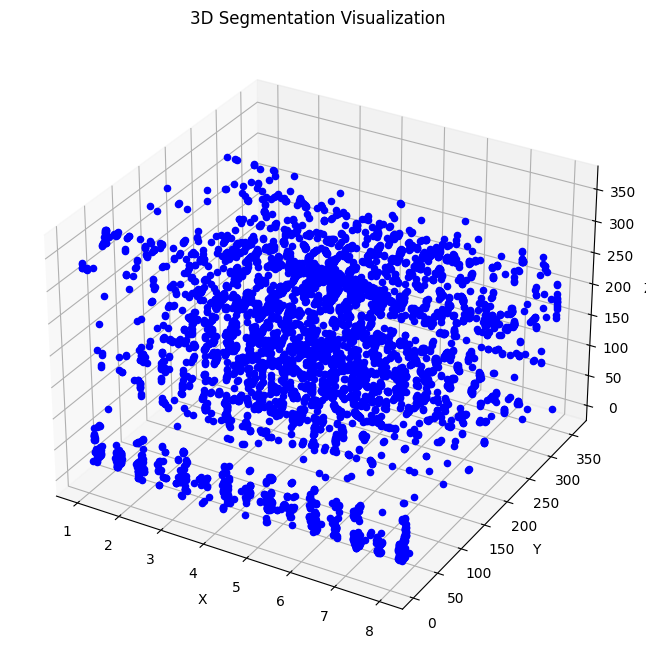

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import clear_border
from skimage.segmentation import slic
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import zoom

# Function to make the dataset isotropic
def make_isotropic(data, target_shape):
    # Calculate the resampling factor for each axis
    resampling_factor = [target_shape[i] / data.shape[i] for i in range(len(data.shape))]
    # Resample the data to achieve isotropy
    isotropic_data = zoom(data, resampling_factor)
    return isotropic_data
# Function to apply Voronoi Otsu labeling on 3D T1 data
def voronoi_otsu_labeling_3d(T1_data):
    # Perform SLIC superpixel segmentation
    T1_data = make_isotropic(T1_data,(362,362,10))
    segments = slic(T1_data, n_segments=100, compactness=10, multichannel=False)

    # Apply Otsu's thresholding to each superpixel region
    labeled_segments = np.zeros_like(segments)
    for region_label in np.unique(segments):
        segment_mask = (segments == region_label)
        otsu_threshold = threshold_otsu(T1_data[segment_mask])
        binary_segment = T1_data[segment_mask] > otsu_threshold
        labeled_segments[segment_mask] = label(binary_segment)

    # Clear borders to remove artifacts
    cleared_segments = clear_border(labeled_segments)

    # Perform closing operation to fill in gaps
    #closed_segments = closing(cleared_segments, square(3))

    # Relabel connected components
    labeled_image, _ = label(cleared_segments, connectivity=3, return_num=True)

    return labeled_image

# Function to visualize 3D segmentation
def visualize_3d_segmentation(segmented_image):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Iterate through each label
    for region in regionprops(segmented_image):
        # Extract coordinates of each label
        z, y, x = region.centroid
        ax.scatter(x, y, z, c='b', marker='o')

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('3D Segmentation Visualization')

    plt.show()


# Apply Voronoi Otsu labeling on 3D T1 data
segmented_image = voronoi_otsu_labeling_3d(T1_data)

# Visualize 3D segmentation
visualize_3d_segmentation(segmented_image)


In [13]:
import numpy as np
import cv2

# Function to perform region growing segmentation
def region_growing(image, seed_point, threshold):
    # Initialize a mask for the segmented region
    segmented = np.zeros_like(image, dtype=np.uint8)

    # Create a queue for storing pixels to be processed
    queue = []
    queue.append(seed_point)

    # Define connectivity (26-connectivity in 3D space)
    connectivity = [(dx, dy, dz) for dx in [-1, 0, 1] for dy in [-1, 0, 1] for dz in [-1, 0, 1] if (dx, dy, dz) != (0, 0, 0)]

    # Process pixels in the queue until it's empty
    while queue:
        # Dequeue a pixel
        current_point = queue.pop(0)

        # Set the pixel as part of the segmented region
        segmented[current_point] = 255

        # Check neighboring pixels
        for dx, dy, dz in connectivity:
            x, y, z = current_point[0] + dx, current_point[1] + dy, current_point[2] + dz

            # Ensure the neighboring pixel is within the image boundaries
            if 0 <= x < image.shape[0] and 0 <= y < image.shape[1] and 0 <= z < image.shape[2]:
                # Check if the neighboring pixel meets the criteria for inclusion
                if abs(int(image[x, y, z]) - int(image[current_point])) < threshold and not segmented[x, y, z]:
                    # Enqueue the neighboring pixel for processing
                    queue.append((x, y, z))

    return segmented

# Parameters for region growing segmentation
seed_point = (100, 100, 9)  # Seed point for starting region growing
threshold = 10  # Intensity threshold for including neighboring pixels

# Perform region growing segmentation on the entire 3D volume
segmented_volume = region_growing(T1_data, seed_point, threshold)

# Calculate IoU for the segmented volume compared to ground truth volume (assuming ground truth is available)
iou = calculate_iou(segmented_volume, ground_truth_labels)
print("IoU Score:", iou)


IoU Score: 8.740257890049303e-07


In [24]:
import numpy as np
import cv2
from sklearn.decomposition import PCA

def apply_pca_3d(volume):
    # Reshape the 3D volume into 2D array (voxels as rows, features as columns)
    voxels = volume.reshape(-1, 1)

    # Perform PCA
    pca = PCA(n_components=1)
    reduced_voxels = pca.fit_transform(voxels)

    # Reshape back to 3D volume
    reduced_volume = reduced_voxels.reshape(volume.shape)

    return reduced_volume

# Function to apply K-means clustering to the region of interest (ROI)
def apply_kmeans_to_roi(roi, num_clusters):
    # Flatten the ROI for clustering
    flat_roi = roi.reshape(-1, 1)

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    labels = kmeans.fit_predict(flat_roi)

    # Reshape the labels back to the original shape of the ROI
    segmented_roi = labels.reshape(roi.shape)

    return segmented_roi

# Function to calculate IoU (Intersection over Union) score
def calculate_iou(segmented_volume, ground_truth_volume):
    intersection = np.logical_and(segmented_volume, ground_truth_volume)
    union = np.logical_or(segmented_volume, ground_truth_volume)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

# Specify the number of clusters (tissue types)
num_clusters = 5


# Convert reduced volume to grayscale (CV_8UC1)
reduced_volume_gray = reduced_volume.astype(np.uint8)

# Threshold the reduced volume to obtain a binary image
_, binary_image = cv2.threshold(reduced_volume_gray, 0, 255, cv2.THRESH_BINARY)

# Find contours in the binary image using cv2.RETR_EXTERNAL mode
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Ensure the contours are properly detected
if len(contours) == 0:
    print("No contours found.")
else:
    print("Contours detected successfully.")

# Create a mask using the largest contour
mask = np.zeros_like(reduced_volume, dtype=np.uint8)
cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)

# Apply the mask to extract the region of interest (ROI)
masked_volume = cv2.bitwise_and(reduced_volume, reduced_volume, mask=mask)

# Apply K-means clustering to the ROI
segmented_roi = apply_kmeans_to_roi(masked_volume, num_clusters)

# Replace the ROI with the segmented ROI in the original volume
segmented_volume = reduced_volume.copy()
segmented_volume[mask > 0] = segmented_roi[mask > 0]

# Calculate IoU for the segmented volume compared to ground truth volume (assuming ground truth is available)
iou_score = calculate_iou(segmented_volume, ground_truth_labels)
print("IoU Score:", iou_score)


error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/contours.cpp:195: error: (-210:Unsupported format or combination of formats) [Start]FindContours supports only CV_8UC1 images when mode != CV_RETR_FLOODFILL otherwise supports CV_32SC1 images only in function 'cvStartFindContours_Impl'
